This script displays visualizations of anomalies in the KPI, UCR, and SWaT datasets. You can explore the script to browse anomaly patterns within each dataset. The folders 'KPI', 'SWaT', and 'UCR' contain publicly available datasets widely used for time series anomaly detection (TSAD). Additionally, the script includes basic data preprocessing for each dataset, and you can obtain the preprocessed dataset ready for use from the 'cleaned_dataset' folder. Each preprocessed dataset is wrapped as a pickle object in the following format:

{'train_data': train_data, 'train_labels': train_labels, 'test_data': test_data, 'test_labels': test_labels}

Dataset **UCR** is strongly recommended for anomaly detection tasks, as most datasets previously used in TSAD (i.e., Yahoo and SWaT) are flawed, which is discussed in [TKDE 2023](https://www.computer.org/csdl/journal/tk/2023/03/09537291/1wTilP0un2U). The Dataset **KPI** is also not suitable to be used as strong benchmarks in TSAD as discussed in my most recent paper, [TriAD](https://github.com/pseudo-Skye/TriAD). 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import os
import warnings
from itertools import groupby
from operator import itemgetter
import pickle
import seaborn as sns
warnings.filterwarnings('ignore')

## Dataset: KPI
KPI values of each KPI ID across the timestamp. Each KPI ID has 8,000-150,000 records (data points). There are in total 29 KPI ID in the dataset, and has been split into half as train and test set. 

[Dataset description](https://competition.aiops-challenge.com/home/competition/1484452272200032281)

\* Note that **the standardization of series value is not used** in this preprocessing phase. 
  

In [2]:
train_filename = './KPI/train.csv'
train_data = pd.read_csv(train_filename)
train_data.head(5)

,timestamp,value,label,KPI ID
0,1476460800,0.012604,0,da10a69f-d836-3baa-ad40-3e548ecf1fbd
1,1476460860,0.017786,0,da10a69f-d836-3baa-ad40-3e548ecf1fbd
2,1476460920,0.012014,0,da10a69f-d836-3baa-ad40-3e548ecf1fbd
3,1476460980,0.017062,0,da10a69f-d836-3baa-ad40-3e548ecf1fbd
4,1476461040,0.023632,0,da10a69f-d836-3baa-ad40-3e548ecf1fbd


\* We want to sort the data framework firstly by ID, then by timestamp ascendingly. Let us start with this toy example.  

In [3]:
l = [[1,'A',99],[1,'C',11],[1,'B',105],[1,'D',97],
     [2,'A',19],[2,'D',14],[2,'C',10],[2,'B',17]]
df = pd.DataFrame(l,columns = ['idx1','idx2','col1'])
df.set_index(['idx1','idx2'],inplace=True)
df

col1
idx1 idx2      
1    A       99
     C       11
     B      105
     D       97
2    A       19
     D       14
     C       10
     B       17

In [4]:
# The sort_index function here can sort multiple indexes by level at the same time
df.sort_index()

col1
idx1 idx2      
1    A       99
     B      105
     C       11
     D       97
2    A       19
     B       17
     C       10
     D       14

Thus, we can continue exploring the dataset by sorting its ID and timestamps. 

In [5]:
train_data = train_data.set_index(['KPI ID', 'timestamp']).sort_index()
train_data.head(5)

value  label
KPI ID                               timestamp               
05f10d3a-239c-3bef-9bdc-a2feeb0037aa 1491041280  35.03      0
                                     1491041340  36.60      0
                                     1491041400  32.79      0
                                     1491041460  34.28      0
                                     1491041520  34.69      0

In [6]:
x_train = {}
y_train = {}
# Group by KPI ID (level 0), name is the KPI ID
for name, df in train_data.groupby(level=0):
    x_train[name] = df['value'].to_numpy()
    y_train[name] = df['label'].to_numpy()

In [7]:
test_filename = './KPI/test.hdf'
test_data = pd.read_hdf(test_filename)
test_data['KPI ID'] = test_data['KPI ID'].apply(str)
test_data = test_data.set_index(['KPI ID', 'timestamp']).sort_index()
test_data.head(5)

value  label
KPI ID                               timestamp               
05f10d3a-239c-3bef-9bdc-a2feeb0037aa 1500012900  37.15      0
                                     1500012960  36.74      0
                                     1500013020  37.59      0
                                     1500013080  38.11      0
                                     1500013140  38.13      0

In [8]:
x_test = {}
y_test = {}
for name, df in test_data.groupby(level=0):
    x_test[name] = df['value'].to_numpy()
    y_test[name] = df['label'].to_numpy()

Visualize the anomalies and normal data points to see the distributions of anomalies. 

In [9]:
# A function to find the slice of anomalies from the sequence
def get_anomaly(value, labels, num):
    id = list(value.keys())[num]
    v = value[id]
    l = len(v)
    k = list(range(l))

    # Find the anomaly
    a = np.argwhere(labels[id]==1)
    a_k = [k[index[0]] for index in a]
    a_v = [v[index[0]] for index in a]
    a_k_seq = []

    # Find the continuous index 
    for  _, g in groupby(enumerate(a_k), lambda x : x[0] - x[1]):
        a_k_seq.append(list(map(itemgetter(1), g)))

    # Find the corresponding anomalies via the indexes
    L = []
    for seq in a_k_seq:
        L.append(len(seq))
    a_v_seq = []
    start = 0
    for l in L:
        a_v_seq.append(a_v[start:start+l])
        start = start+l
    return k, v, a_k_seq, a_v_seq

In [10]:
# A function to visualize the data points
def plot_data(k, v, a_k_seq, a_v_seq, ax):
    # plot lines
    ax.plot(k, v, color = 'grey')
    for i in range(len(a_k_seq)):
        ax.plot(a_k_seq[i], a_v_seq[i], color = 'red', linewidth=1) 

### Visualize the training dataset

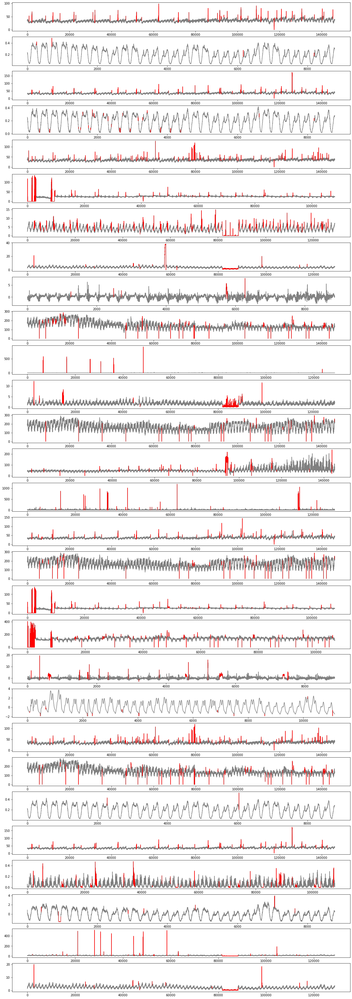

In [11]:
fig, axs = plt.subplots(29,1, figsize = (20,60))
for i in range(29):
    train_k, train_v, train_a_k_seq, train_a_v_seq = get_anomaly(x_train, y_train, i)
    plot_data(train_k, train_v, train_a_k_seq, train_a_v_seq, axs[i])

### Visualize the test dataset

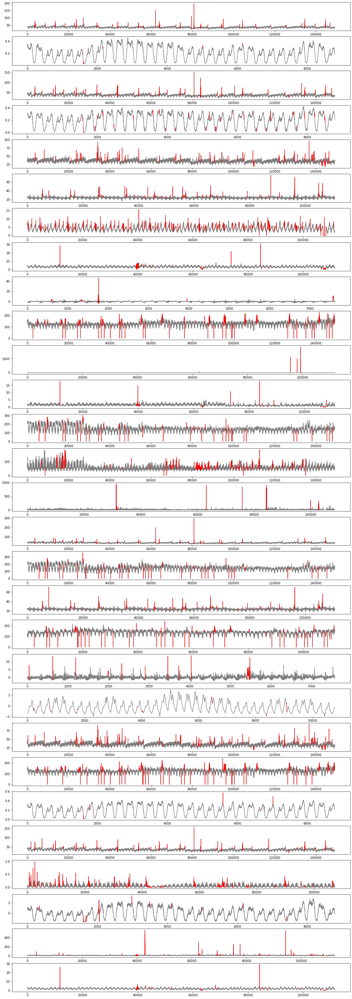

In [12]:
fig, axs = plt.subplots(29,1, figsize = (20,60))
for i in range(29):
    test_k, test_v, test_a_k_seq, test_a_v_seq = get_anomaly(x_test, y_test, i)
    plot_data(test_k, test_v, test_a_k_seq, test_a_v_seq, axs[i])

### Visualize some of 'one-liner' problematic datasets in KPI

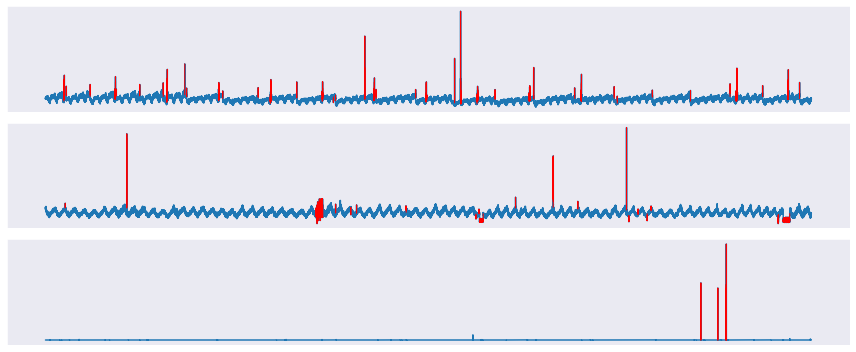

In [13]:
sns.set_style("dark")
fig, axs = plt.subplots(3,1, figsize = (12,5))
id_list = [0,7,10]
for i in range(3):
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    test_k, test_v, test_a_k_seq, test_a_v_seq = get_anomaly(x_test, y_test, id_list[i])
    sns.lineplot(test_k, test_v, ax=axs[i],linewidth=1.5)
    for j in range(len(test_a_k_seq)):
        sns.lineplot(test_a_k_seq[j], test_a_v_seq[j], color = 'red', linewidth=1, ax=axs[i])
plt.tight_layout()
plt.show()

In [15]:
output_file = 'cleaned_dataset/kpi_data.pt'
with open(output_file, 'wb') as f:
        pickle.dump({
            'train_data': x_train,
            'train_labels': y_train,
            'test_data': x_test,
            'test_labels': y_test,
        }, f)

## Dataset: UCR 
This big dataset contains 250 time series. Each file contains a single time series dataset as 'dataset number_UCR_Anomaly_dataset name_X_start_end.txt', where **1:X** is training data that **free of anomalies**, while **X:-1** is test data and **start:end** is where the anomalies fall. **The test data has only one anomaly.**

\* Note that every dataset is considered completely **independent** of the other datasets. 

In [14]:
directory = './UCR'

Some files are formatted differently:  tabulator between values instead of line break. This can lead to a problem when reading the files, e.g. when using pandas.read_csv(...). This applies to file number 204, 205, 206, 207, 208, 225, 226, 242 and 243.

In [15]:
for filename in os.listdir(directory):
    file = os.path.join(directory, filename)
    name = filename.split('_')[0]
    if name =='025':
        # Get the training set and anomaly time stamps from the file name
        train, start, end = [int(l)-1 for l in filename.split(".")[0].split("_")[-3:]]
        values = pd.read_csv(file, header=None)[0].values
        print(len(values[train:]))


4702


In [16]:
diff_set = ['204', '205', '206', '207', '208', '225', '226', '242', '243']
train_data = {} # Same as KPI, we store everything as {dataset_name:[value]}
train_labels = {}
test_data = {}
test_labels = {}

for filename in os.listdir(directory):
    file = os.path.join(directory, filename)
    name = filename.split('_')[0]
    # Get the training set and anomaly time stamps from the file name
    train, start, end = [int(l)-1 for l in filename.split(".")[0].split("_")[-3:]]

    if name in diff_set:
        values = pd.read_csv(file, delim_whitespace=True, header=None).values[0]
    else:
        values = pd.read_csv(file, header=None)[0].values
    
    # Label the anomalies in test set
    labels = np.zeros(len(values))
    labels[start:end+1] = 1

    # Retrieve the training set and test set with labels
    train_x = values[0:train] 
    test_x = values[train:]
    train_y = labels[0:train] 
    test_y = labels[train:]

    train_data[name] = train_x
    train_labels[name] = train_y
    test_data[name] = test_x
    test_labels[name] = test_y

### Visualize the whole dataset (train+test)

In [17]:
all_data = {}
all_labels = {}
for name in train_data.keys():
    all_data[name] = np.concatenate((train_data[name], test_data[name]))
    all_labels[name] = np.concatenate((train_labels[name], test_labels[name]))

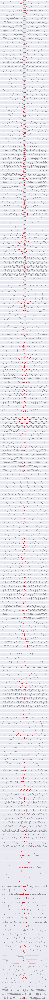

In [18]:
fig, axs = plt.subplots(250,1, figsize = (20,420))
i = 0
for name in all_data.keys():
    v = all_data[name]
    l = len(v)
    k = list(range(l))
    # Find the anomaly
    a = np.argwhere(all_labels[name]==1)
    start, end = a[0][0], a[-1][0]
    a_v = v[start:end+1]
    a_k = list(range(start,end+1))
    # plot lines
    axs[i].plot(k[start-1000:end+1000], v[start-1000:end+1000], color = 'grey')
    axs[i].plot(a_k, a_v, color = 'red', linewidth=2)
    if len(a_k) == 1:
        axs[i].plot(a_k, a_v, 'o', color = 'red', markersize=3)
    axs[i].set_xticks([]) 
    axs[i].set_yticks([]) 
    axs[i].set_title(f'UCR {name}')
    i += 1

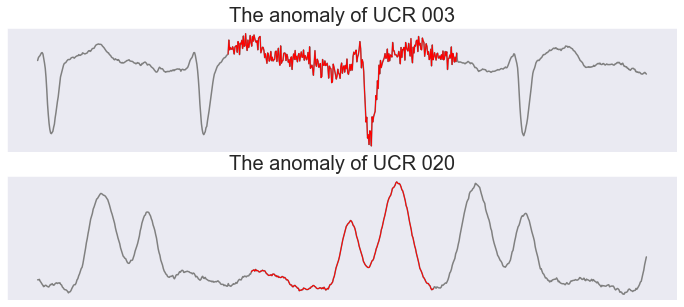

In [19]:
sns.set_style('dark')
fig, axs = plt.subplots(2,1, figsize = (12,5))
id_list = list(all_data.keys())
name_list = [id_list[2], id_list[19]]
i = 0
for name in name_list:
    v = all_data[name]
    l = len(v)
    k = list(range(l))
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    # Find the anomaly
    a = np.argwhere(all_labels[name]==1)
    start, end = a[0][0], a[-1][0]
    a_v = v[start:end+1]
    a_k = list(range(start,end+1))
    # plot lines
    axs[i].plot(k[start-250:end+250], v[start-250:end+250], color = 'grey')
    axs[i].plot(a_k, a_v, color = 'red', linewidth=1) 
    axs[i].set_title(f'The anomaly of UCR {name}', size = 20)
    i += 1

In [9]:
output_file = 'cleaned_dataset/ucr_data.pt'
with open(output_file, 'wb') as f:
        pickle.dump({
            'train_data': train_data,
            'train_labels': train_labels,
            'test_data': test_data,
            'test_labels': test_labels,
        }, f)

### The dataset statistics

In [20]:
anom_len = []
for id in train_data.keys():
    labels = test_labels[id]
    a_len = len(labels[labels == 1])
    anom_len.append(a_len)

In [21]:
# Convert the list to a numpy array
anom_len = np.array(anom_len)
# Calculate statistics
mean_value = np.mean(anom_len)
median_value = np.median(anom_len)
std_deviation = np.std(anom_len)
min_value = np.min(anom_len)
max_value = np.max(anom_len)
# Create a dictionary to store the results
summary = {
    "Mean": mean_value,
    "Median": median_value,
    "Standard Deviation": std_deviation,
    "Minimum": min_value,
    "Maximum": max_value
}
for key, value in summary.items():
    print(f"{key}: {value}")

Mean: 197.452
Median: 101.0
Standard Deviation: 237.72269495359504
Minimum: 1
Maximum: 1701


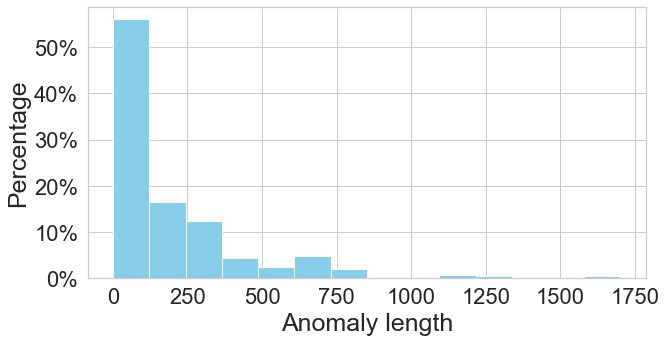

In [22]:
# Plot histogram
num_bins = 5
 # Set the style of seaborn
sns.set(style="whitegrid")
# Calculate the number of bins based on the desired bin width
num_bins = int((max(anom_len) - min(anom_len)) / 120)
# Plot histogram
fig = plt.figure(figsize=(10, 5))  # Adjust the figure size as needed
plt.hist(anom_len, bins=num_bins, color='skyblue', weights=np.ones(len(anom_len)) / len(anom_len))
# Add labels and title
plt.xlabel('Anomaly length', fontsize=25)
plt.ylabel('Percentage', fontsize=25)
plt.xticks(fontsize=22)
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
plt.yticks(fontsize=22)
# Display the plot
plt.show()


## Dataset: SWaT
This dataset contains the univariate time series from 3 sensors: FIT401 (flawed dataset, abandoned), LIT 101 and LIT 301, and each will be treated as an individual dataset. The data will be split into training and test set by 70% and 30% with anomaly labels. 

In [23]:
file_101 = './SWaT/swat_LIT101.csv'
file_301 = './SWaT/swat_LIT301.csv'

data_101 = pd.read_csv(file_101).iloc[:, 1:]
data_301 = pd.read_csv(file_301).iloc[:, 1:]
data_301.head(5)

,timestamp,value,is_anomaly
0,0,956.1651,0
1,1,956.1651,0
2,2,956.4855,0
3,3,956.8060,0
4,4,957.0864,0


In [24]:
# A function to find locations of anomaly sequences 
def anomaly_summary(labels):
    print(f'the sequence length is {len(labels)}')
    # Find the anomaly sequences
    a_index = np.where(labels==1)[0]
    anomalies = []
    # Find the continuous index 
    for  _, g in groupby(enumerate(a_index), lambda x : x[0] - x[1]):
        anomalies.append(list(map(itemgetter(1), g)))
    print(f'In total {len(anomalies)} anomaly sequences')
    for a in anomalies:
        print(f'start:', a[0], ' end:', a[-1])

In [25]:
print('---------LIT 101---------')
anomaly_summary(data_101['is_anomaly'])
print('---------LIT 301---------')
anomaly_summary(data_301['is_anomaly'])

---------LIT 101---------
the sequence length is 449919
In total 5 anomaly sequences
start: 4920  end: 5302
start: 117000  end: 117720
start: 280060  end: 281230
start: 361191  end: 363434
start: 389680  end: 390279
---------LIT 301---------
the sequence length is 449919
In total 5 anomaly sequences
start: 7705  end: 8133
start: 93445  end: 93720
start: 198296  end: 199740
start: 347679  end: 348279
start: 443501  end: 445175


Split the time series into train, test, and validation. 

In [26]:
def split_dataset(data):
    train_value = data[:int(0.7 * len(data)),1]
    train_label = data[:int(0.7 * len(data)),2]
    test_value = data[int(0.7 * len(data)):, 1]
    test_label = data[int(0.7 * len(data)):, 2]
    return train_value, train_label, test_value, test_label

In [27]:
x_train = {}
y_train = {}
x_test = {}
y_test = {}
datasets = [data_301, data_101]
key_id = ['LIT301','LIT101']
i = 0
for data in datasets:
    train_value, train_label, test_value, test_label = split_dataset(data.values)
    id = key_id[i]
    x_train[id] = train_value
    y_train[id] = train_label
    x_test[id] = test_value
    y_test[id] = test_label
    i+=1

### Visualize the training dataset

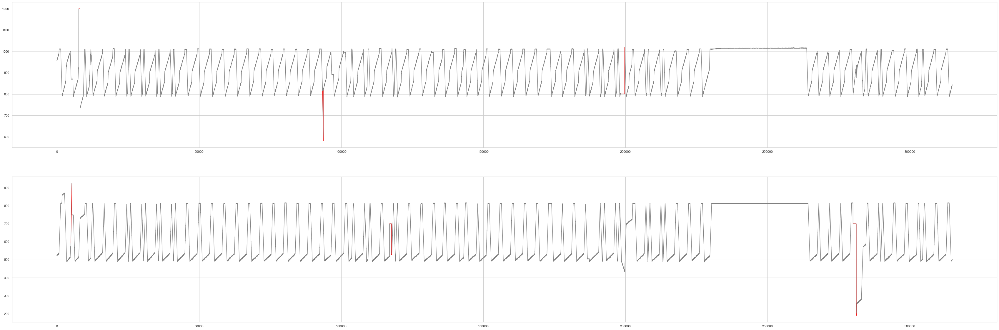

In [28]:
fig, axs = plt.subplots(2,1, figsize = (60,20))
for i in range(2):
    train_k, train_v, train_a_k_seq, train_a_v_seq = get_anomaly(x_train, y_train, i)
    plot_data(train_k, train_v, train_a_k_seq, train_a_v_seq, axs[i])

### Visualize the test dataset

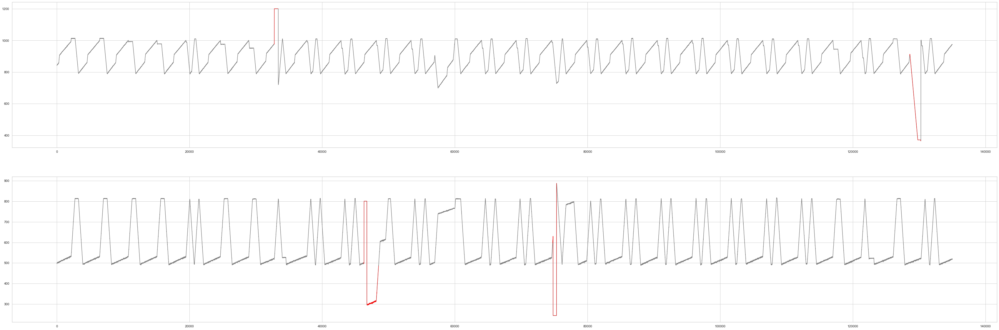

In [29]:
fig, axs = plt.subplots(2,1, figsize = (60,20))
for i in range(2):
    test_k, test_v, test_a_k_seq, test_a_v_seq = get_anomaly(x_test, y_test, i)
    plot_data(test_k, test_v, test_a_k_seq, test_a_v_seq, axs[i])

In [47]:
output_file = 'cleaned_dataset/swat_data.pt'
with open(output_file, 'wb') as f:
        pickle.dump({
            'train_data': x_train,
            'train_labels': y_train,
            'test_data': x_test,
            'test_labels': y_test,
        }, f)
